In [13]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from sklearn.metrics import accuracy_score

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPool2D


In [2]:
train = ImageDataGenerator(rescale = 1/255)
validation = ImageDataGenerator(rescale=1/255)

In [3]:
train_dataset = train.flow_from_directory('Dataset/Train/', 
                                          target_size=(200,200),
                                          batch_size = 32,
                                         class_mode = 'binary')

validation_dataset = validation.flow_from_directory('Dataset/Validation/',
                                            target_size=(200,200),
                                            batch_size = 32,
                                            class_mode = 'binary')

Found 840 images belonging to 2 classes.
Found 150 images belonging to 2 classes.


In [4]:
train_dataset.class_indices

{'Abnormal': 0, 'Normal': 1}

In [5]:
model = Sequential([Conv2D(16, (3,3), activation='relu', input_shape=(200,200,3)),
                           MaxPool2D(2,2),
                           #
                           Conv2D(32, (3,3), activation='relu'),
                           MaxPool2D(2,2),
                           #
                           Conv2D(64, (3,3), activation='relu'),
                           MaxPool2D(2,2),
                           #
                           Flatten(),
                           ##
                           Dense(512, activation='relu'),
                           ##
                           Dense(1, activation='sigmoid')
                          ])

In [6]:
model.compile(loss="binary_crossentropy",
             optimizer = RMSprop(lr=0.001),
             metrics=['accuracy'])

In [10]:
model_fit = model.fit(train_dataset,
                     epochs=10,
                     validation_data=validation_dataset)

Epoch 1/10
27/27 [==============================] - 140s 5s/step - loss: 0.4097 - accuracy: 0.8869 - val_loss: 0.1623 - val_accuracy: 0.9933
Epoch 2/10
27/27 [==============================] - 150s 6s/step - loss: 0.3062 - accuracy: 0.9060 - val_loss: 0.0783 - val_accuracy: 0.9933
Epoch 3/10
27/27 [==============================] - 161s 6s/step - loss: 0.2912 - accuracy: 0.8536 - val_loss: 0.1157 - val_accuracy: 0.9867
Epoch 4/10
27/27 [==============================] - 169s 6s/step - loss: 0.2065 - accuracy: 0.9512 - val_loss: 0.0441 - val_accuracy: 0.9933
Epoch 5/10
27/27 [==============================] - 162s 6s/step - loss: 0.1880 - accuracy: 0.9333 - val_loss: 0.0706 - val_accuracy: 0.9933
Epoch 6/10
27/27 [==============================] - 164s 6s/step - loss: 0.3204 - accuracy: 0.9000 - val_loss: 0.0684 - val_accuracy: 0.9867
Epoch 7/10
27/27 [==============================] - 152s 6s/step - loss: 0.1560 - accuracy: 0.9155 - val_loss: 0.0663 - val_accuracy: 0.9867
Epoch 8/10
27

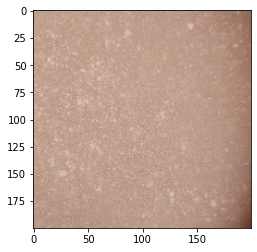

Abnormal


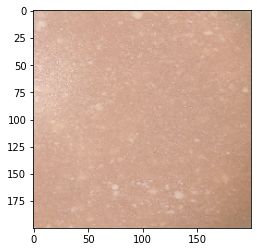

Abnormal


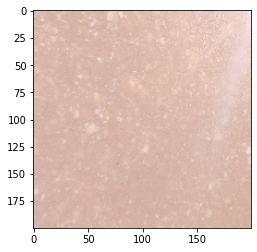

Abnormal


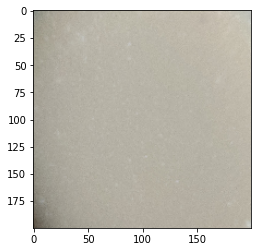

Normal


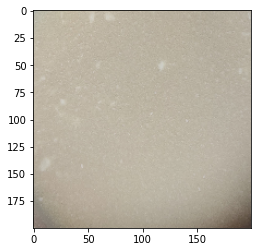

Abnormal


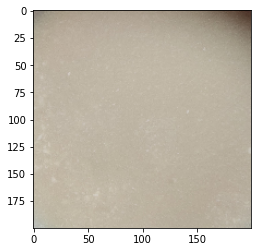

Abnormal


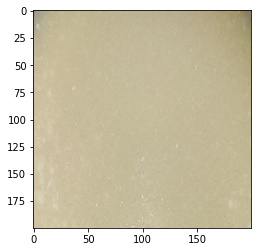

Abnormal


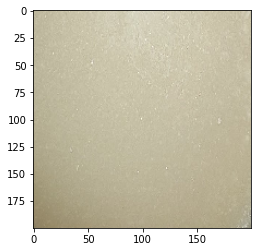

Abnormal


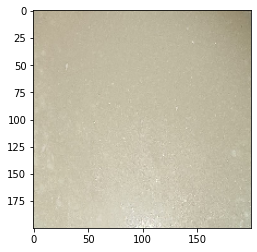

Abnormal


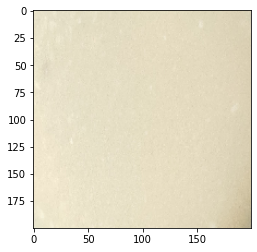

Abnormal


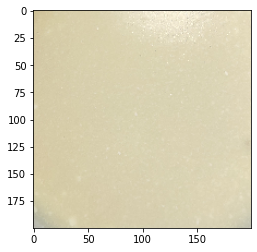

Abnormal


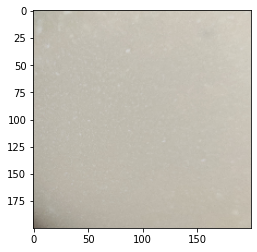

Normal


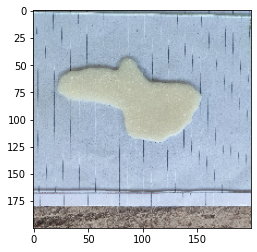

Abnormal


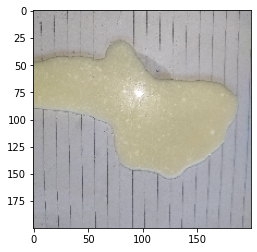

Abnormal


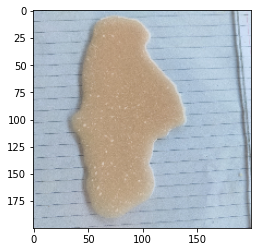

Abnormal


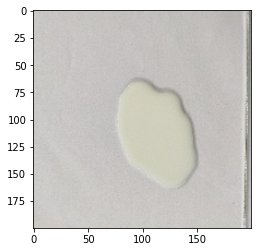

Normal


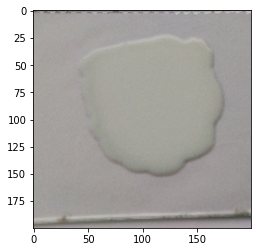

Normal


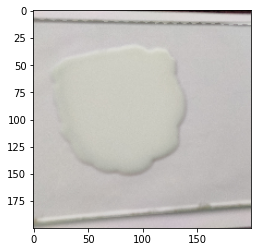

Normal


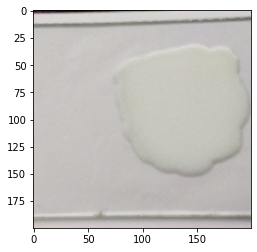

Normal


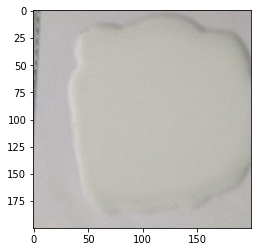

Normal


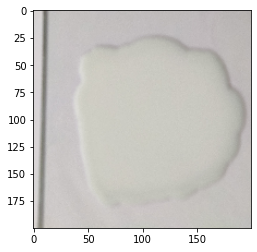

Normal


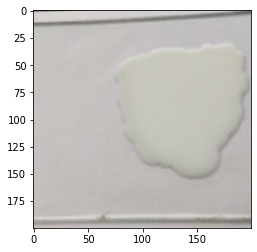

Normal


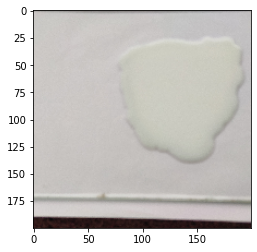

Normal


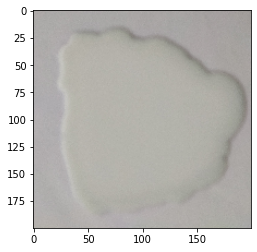

Normal


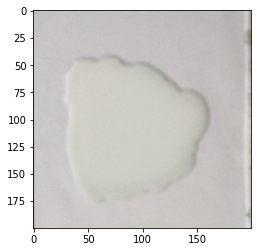

Normal


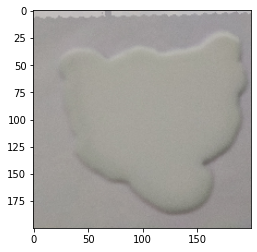

Normal


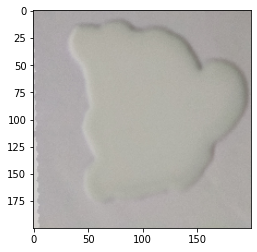

Normal


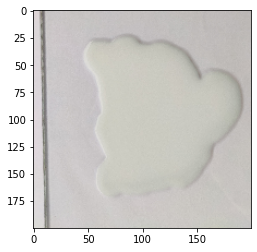

Normal


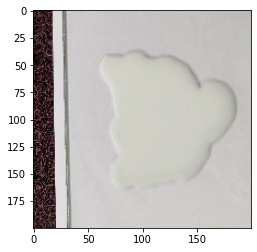

Normal


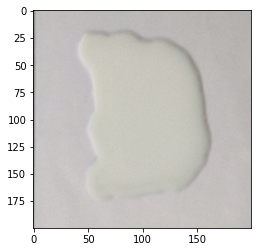

Normal


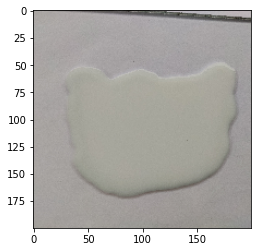

Normal


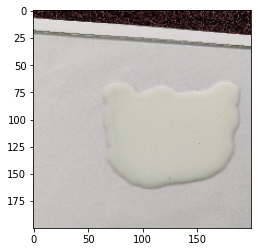

Normal


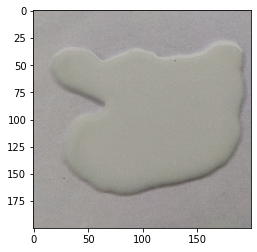

Normal


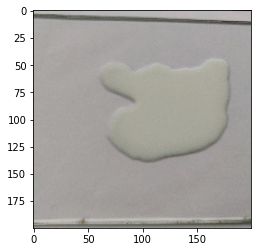

Normal


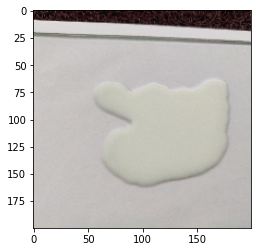

Normal


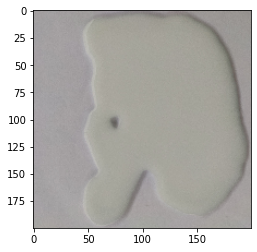

Normal


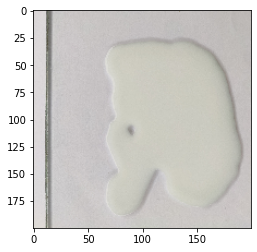

Normal


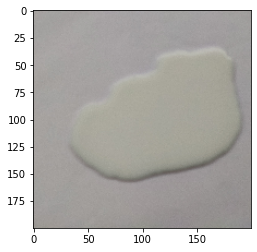

Normal


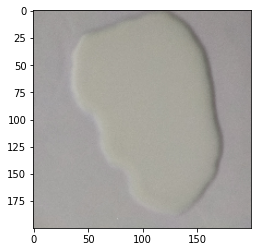

Normal


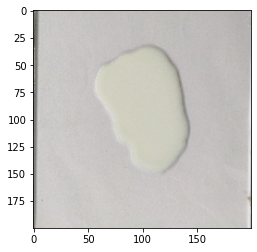

Normal


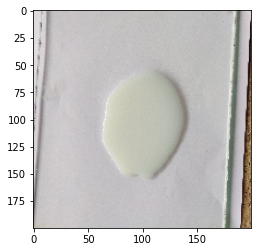

Normal


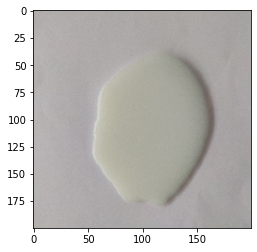

Normal


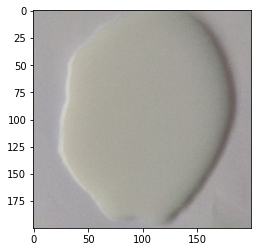

Normal


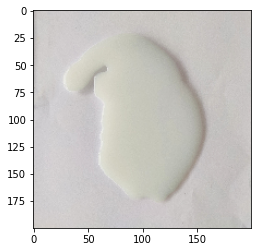

Normal


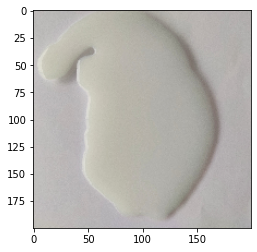

Normal


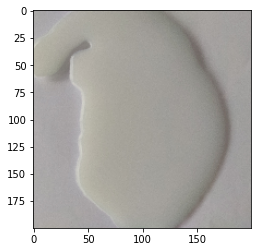

Normal


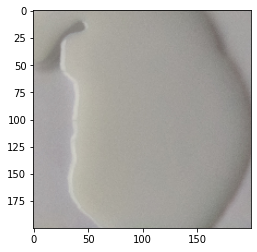

Normal


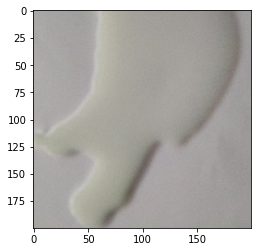

Normal


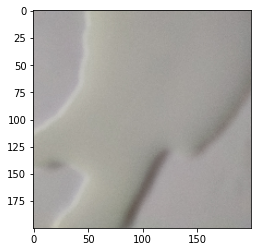

Normal


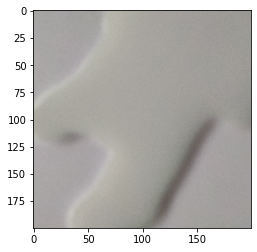

Normal


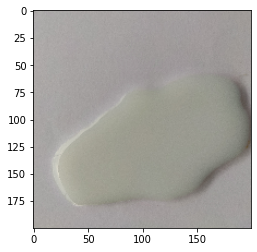

Normal


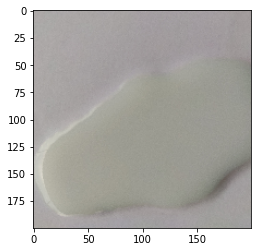

Normal


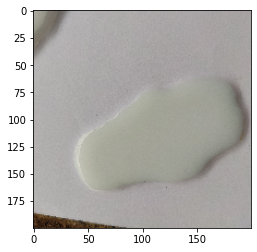

Normal


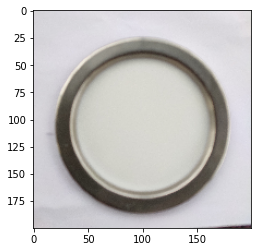

Normal


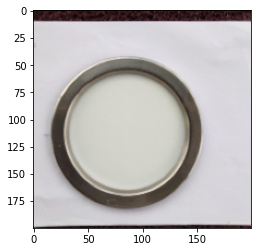

Normal


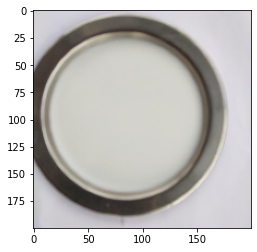

Normal


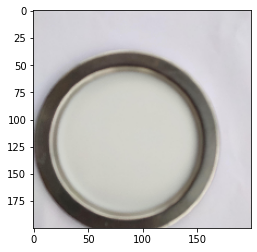

Normal


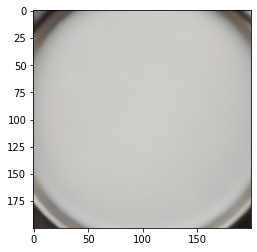

Normal


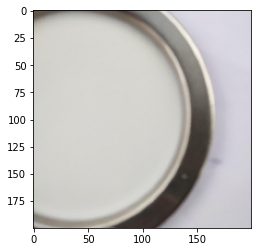

Normal


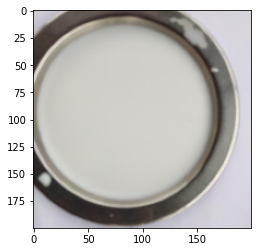

Normal


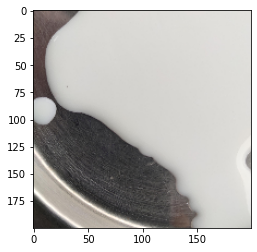

Normal


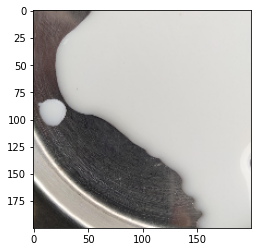

Normal


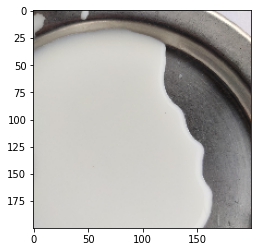

Normal


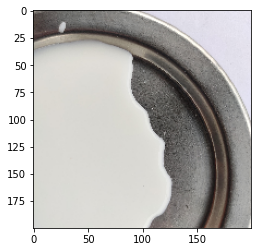

Abnormal


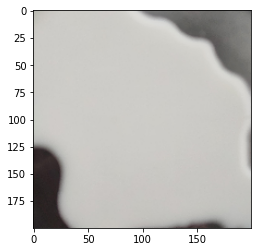

Normal


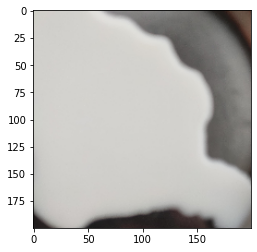

Normal


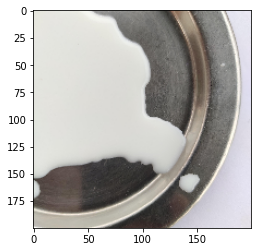

Normal


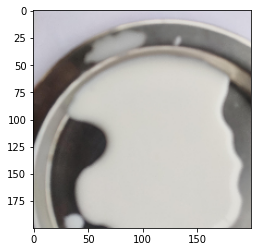

Normal


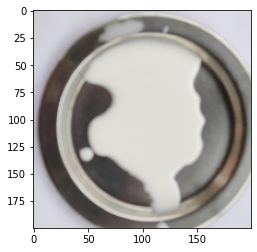

Normal


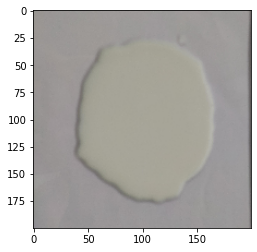

Normal


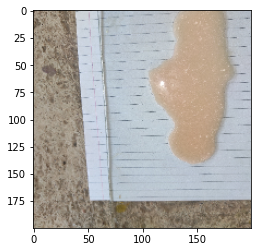

Abnormal


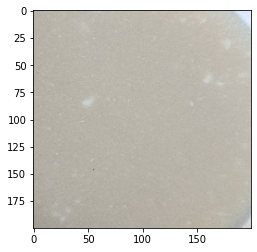

Normal


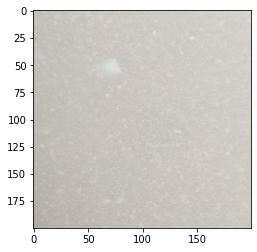

Normal


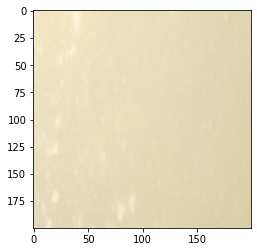

Abnormal


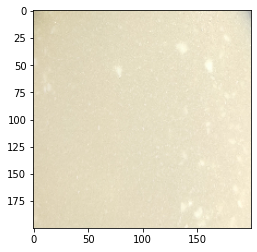

Abnormal


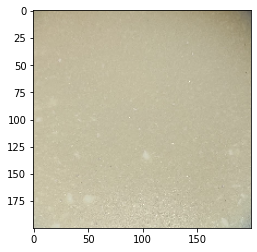

Abnormal


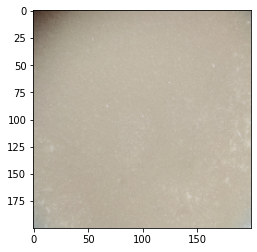

Abnormal


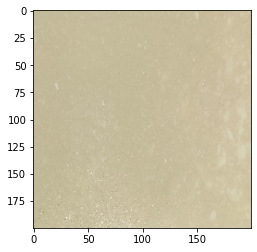

Abnormal


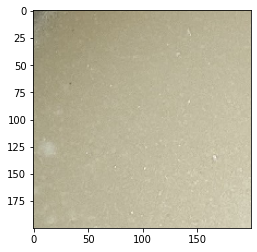

Abnormal


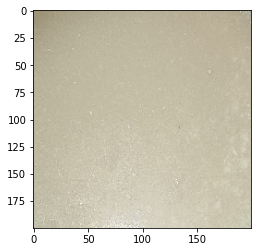

Abnormal


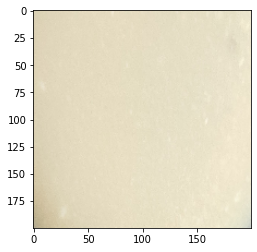

Abnormal


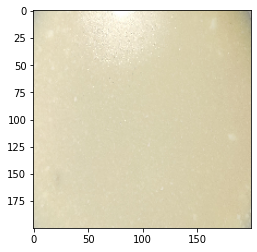

Abnormal


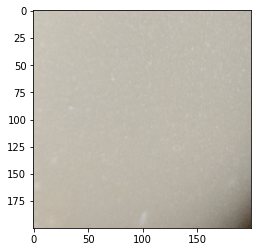

Normal


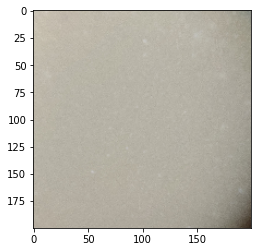

Normal


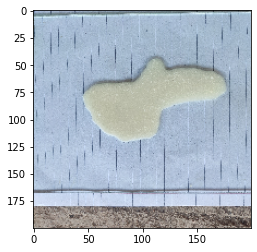

Abnormal


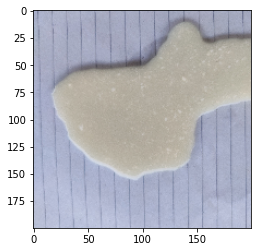

Normal


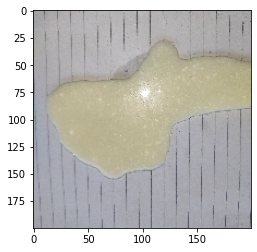

Abnormal


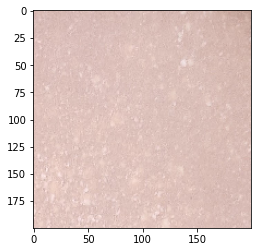

Abnormal


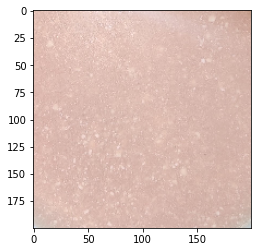

Abnormal


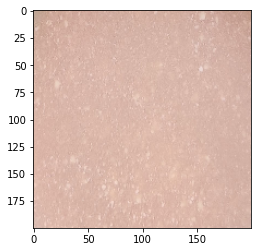

Abnormal


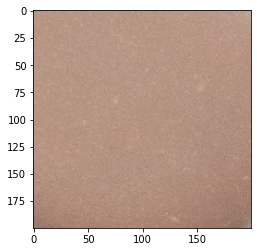

Abnormal


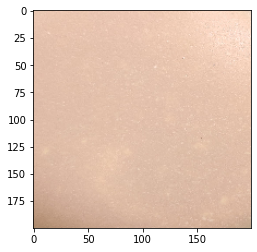

Abnormal


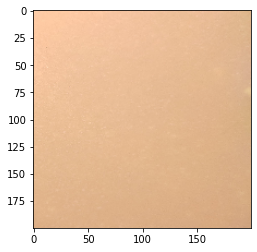

Abnormal


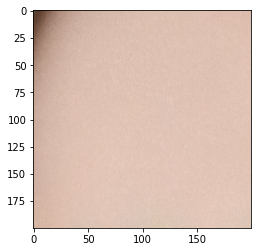

Abnormal


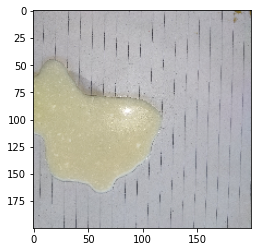

Abnormal


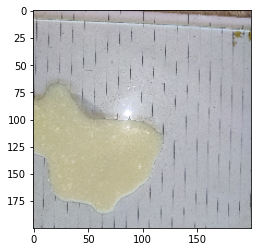

Normal


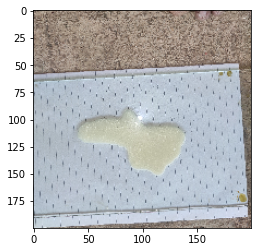

Abnormal


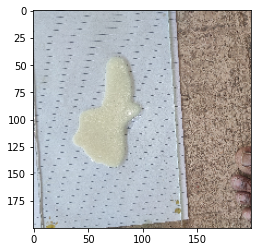

Abnormal


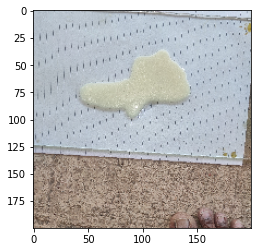

Abnormal


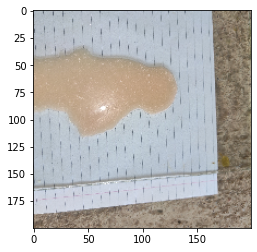

Abnormal


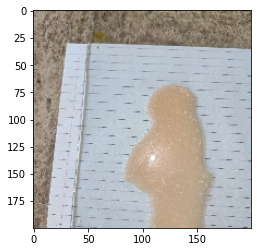

Abnormal


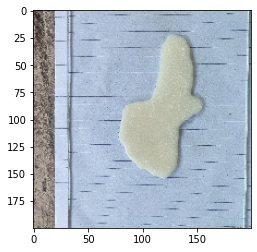

Abnormal


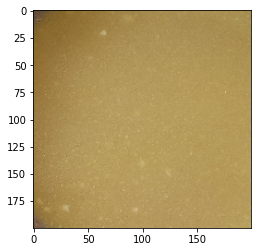

Abnormal


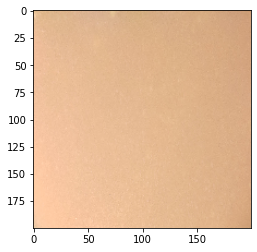

Abnormal


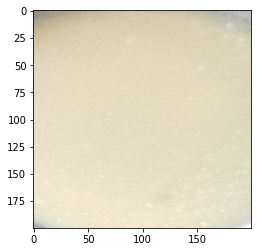

Abnormal


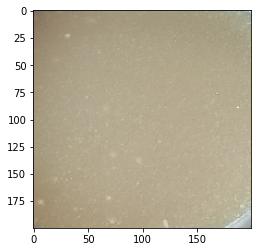

Abnormal


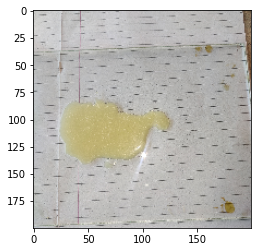

Abnormal


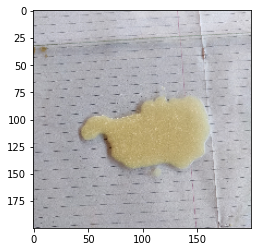

Abnormal


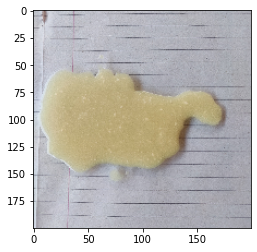

Abnormal


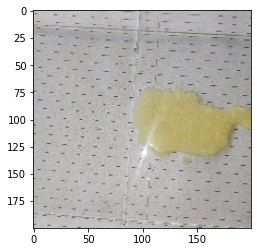

Abnormal


In [15]:
dir_path = 'Dataset/Test/'
val_list = []

for i in os.listdir(dir_path):
    img = image.load_img(dir_path+'/'+i, target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X, axis=0)
    images=np.vstack([X])
    
    val = model.predict(images)
    val_list.append(val)
    if val == 0:
        print("Abnormal")
    else:
        print("Normal")
        
# img = image.load_img(dir_path+"c486.jpg", target_size=(200,200))
# plt.imshow(img)
# plt.show()
# X = image.img_to_array(img)
# X = np.expand_dims(X, axis=0)
# images=np.vstack([X])
    
# val = model.predict(images)
# if val == 0:
#     print("Abnormal")
# else:
#     print("Normal")

In [11]:
val_classes = model.predict_classes(images)
val_classes = val_classes[:, 0]

In [9]:
model.save('mastitis.h5')

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_train_5, y_train_pred)